<a href="https://colab.research.google.com/github/ryali93/pucp_dl_objectdetection/blob/master/rcnn_regresion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Configurar GPU

In [ ]:
!nvidia-smi

- Menu > Runtime > Change runtime.

In [ ]:
!nvidia-smi

Thu Dec 17 03:22:08 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch
torch.cuda.is_available()

True

In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243


## Espacio de trabajo

In [ ]:
!sudo apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 14 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 1s (71.4 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 144865 files and directories currently instal

In [ ]:
%cd drive/MyDrive/ciclo_02/deep_learning/bbox_regresion/

/content/drive/MyDrive/ciclo_02/deep_learning/bbox_regresion


In [ ]:
!tree --dirsfirst --filelimit 15

.
├── dataset
│   ├── images [800 entries exceeds filelimit, not opening dir]
│   └── airplanes.csv
├── output
│   ├── detector.h5
│   ├── plot.png
│   └── test_images.txt
├── pyimagesearch
│   ├── __pycache__
│   │   ├── config.cpython-36.pyc
│   │   └── __init__.cpython-36.pyc
│   ├── config.py
│   └── __init__.py
├── bbox_regresion.ipynb
├── predict.py
└── train.py

5 directories, 11 files


## Creando nuestra propia configuración

### Config.py

In [ ]:
import os

BASE_PATH = "dataset"
IMAGES_PATH = os.path.sep.join([BASE_PATH, "images"])
ANNOTS_PATH = os.path.sep.join([BASE_PATH, "airplanes.csv"])

BASE_OUTPUT = "output"
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
TEST_FILENAMES = os.path.sep.join([BASE_OUTPUT, "test_images.txt"])

INIT_LR = 1e-4
NUM_EPOCHS = 25
BATCH_SIZE = 32

## Train.py

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [ ]:
print("[INFO] loading dataset...")
rows = open(ANNOTS_PATH).read().strip().split("\n")

data = []
targets = []
filenames = []

[INFO] loading dataset...


In [ ]:
for row in rows:
	row = row.split(",")
	(filename, startX, startY, endX, endY) = row
  
	imagePath = os.path.sep.join([IMAGES_PATH, filename])
	image = cv2.imread(imagePath)
	(h, w) = image.shape[:2]
	startX = float(startX) / w
	startY = float(startY) / h
	endX = float(endX) / w
	endY = float(endY) / h
	image = load_img(imagePath, target_size=(224, 224))
	image = img_to_array(image)

	data.append(image)
	targets.append((startX, startY, endX, endY))
	filenames.append(filename)

In [ ]:
data = np.array(data, dtype="float32") / 255.0
targets = np.array(targets, dtype="float32")
split = train_test_split(data, targets, filenames, test_size=0.10, random_state=42)
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
print("[INFO] saving testing filenames...")
f = open(TEST_FILENAMES, "w")
f.write("\n".join(testFilenames))
f.close()

[INFO] saving testing filenames...


In [ ]:
vgg = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = Flatten()(flatten)
bboxHead = Dense(128, activation="relu")(flatten)
bboxHead = Dense(64, activation="relu")(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
model = Model(inputs=vgg.input, outputs=bboxHead)

58892288/58889256 [==============================] - 0s 0us/step


In [ ]:
opt = Adam(lr=INIT_LR)
model.compile(loss="mse", optimizer=opt)
print(model.summary())
print("[INFO] training bounding box regressor...")
H = model.fit(
	trainImages, trainTargets,
	validation_data=(testImages, testTargets),
	batch_size=BATCH_SIZE,
	epochs=NUM_EPOCHS,
	verbose=1)

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [ ]:
!ls output/

detector.h5  plot.png  test_images.txt


## Predict.py

In [ ]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import cv2
import os

In [ ]:
args = {}
args["input"] = "output/test_images.txt"

In [ ]:
filetype = mimetypes.guess_type(args["input"])[0]
imagePaths = [args["input"]]
if "text/plain" == filetype:
	filenames = open(args["input"]).read().strip().split("\n")
	imagePaths = []
	for f in filenames:
		p = os.path.sep.join([IMAGES_PATH, f])
		imagePaths.append(p)

In [ ]:
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)

[INFO] loading object detector...


In [ ]:
from google.colab.patches import cv2_imshow

[INFO] loading object detector...


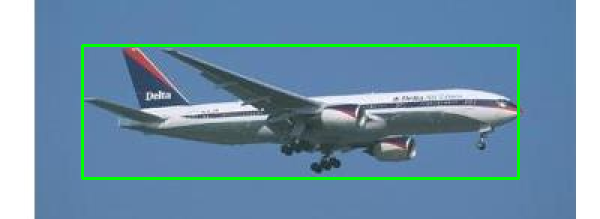

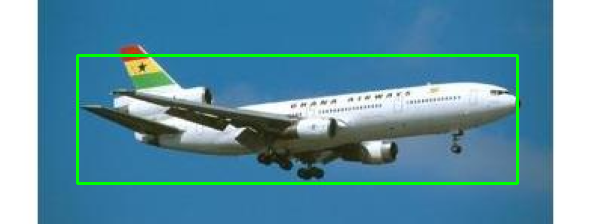

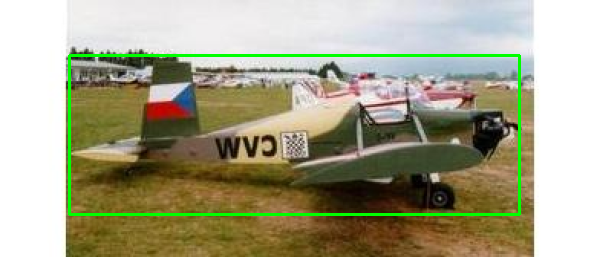

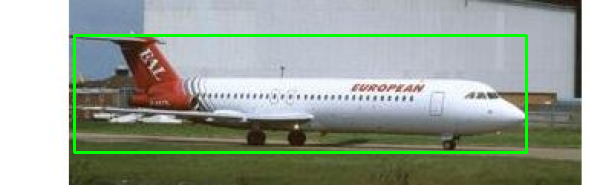

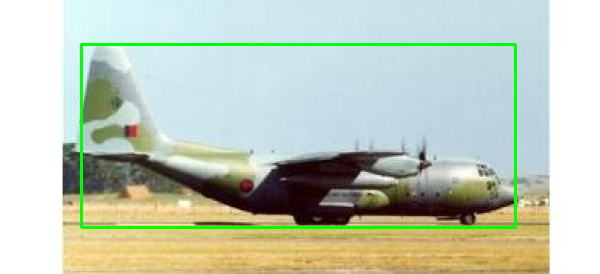

...

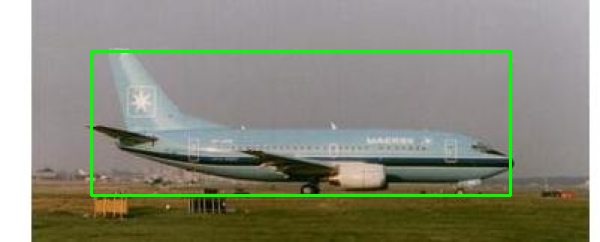

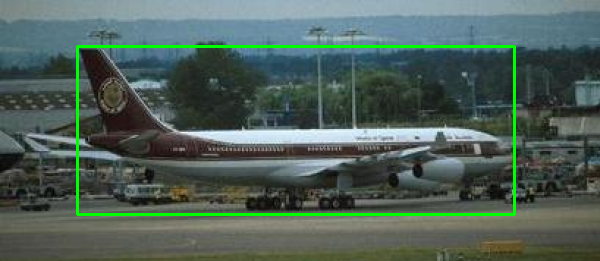

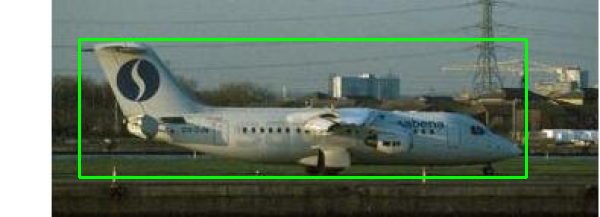

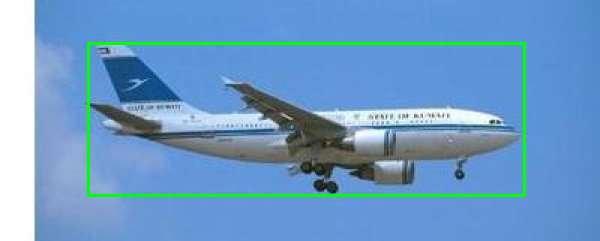

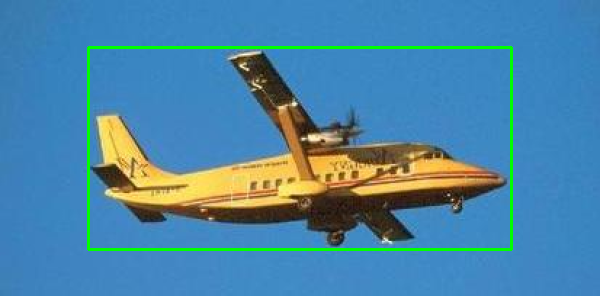

In [ ]:
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)
for imagePath in imagePaths:
	image = load_img(imagePath, target_size=(224, 224))
	image = img_to_array(image) / 255.0
	image = np.expand_dims(image, axis=0)
	preds = model.predict(image)[0]
	(startX, startY, endX, endY) = preds
	image = cv2.imread(imagePath)
	image = imutils.resize(image, width=600)
	(h, w) = image.shape[:2]
	startX = int(startX * w)
	startY = int(startY * h)
	endX = int(endX * w)
	endY = int(endY * h)
	cv2.rectangle(image, (startX, startY), (endX, endY), (0, 255, 0), 2)
	cv2_imshow(image)
	cv2.waitKey(0)